In [1]:
# load packages

from skimage import io
from skimage.registration import phase_cross_correlation
from scipy.ndimage import fourier_shift
from aicsimageio import AICSImage
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import czifile
import xml.etree.ElementTree as ET
from datetime import datetime, timezone
import pandas as pd
from datetime import datetime, timezone, timedelta
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

def get_metadata(czi_file_path):
    """
    Extract metadata information from a CZI file.

    Parameters:
    - czi_file_path (str): Path to the CZI file.

    Returns:
    - dict: Dictionary containing various metadata parameters.
    """
    # Open the CZI file
    with czifile.CziFile(czi_file_path) as czi:
        # Read the metadata from the CZI file
        metadata = czi.metadata()
        img = AICSImage(czi_file_path)
        root = ET.fromstring(metadata)

        RI = root.find(".//RefractiveIndex").text
        PinholeSizeAiry = root.find(".//PinholeSizeAiry").text    
        SizeX = root.find(".//SizeX").text
        SizeY = root.find(".//SizeY").text
        SizeZ = root.find(".//SizeZ").text
        SizeC = root.find(".//SizeC").text

        fluor = [x.text for x in root.findall('.//Fluor')]
        exwave = [x.text for x in root.findall('.//ExcitationWavelength')]
        emwave = [x.text for x in root.findall('.//EmissionWavelength')]
        #pinhole_diam = [x.text for x in root.findall('.//Position')]
        
        parameter_id = "MTBLSMPinholeDiameter"
        pinhole_diam = [x.text for x in root.findall(f'.//ParameterCollection[@Id="{parameter_id}"]/Position')]


        NA = [x.text for x in root.findall('.//NumericalAperture')]
        bits = [x.text for x in root.findall('.//BitsPerPixel')]
        time = [x.text for x in root.findall('.//AcquisitionDateAndTime')]
        intensity = [x.text for x in root.findall('.//Intensity')]

        DigitalGain = [x.text for x in root.findall('.//DigitalGain')]
        DigitalOffset = [x.text for x in root.findall('.//DigitalOffset')]

        TotalMagnification = [x.text for x in root.findall('.//TotalMagnification')]
        TotalAperture = [x.text for x in root.findall('.//TotalAperture')]

        LaserEnableTime = [x.text for x in root.findall('.//LaserEnableTime')]
        #ZStackSliceIndex = [x.text for x in root.findall('.//LineStep')]

        dictionary2 = dict({'RI': RI,
              'PinholeSizeAiry': PinholeSizeAiry,
              'SizeX': SizeX, 
              'SizeY': SizeY,
              'SizeZ': SizeZ,
              'SizeC': SizeC,
              'Fluor': fluor,
              'ExcitationWavelength': exwave,
              'EmissionWavelength': emwave,
              'MTBLSMPinholeDiameter': pinhole_diam,
              'NumericalAperture': NA,
              'BitsPerPixel': bits,
              'AcquisitionDateAndTime': time,
              'Intensity': intensity,
              'DigitalGain': DigitalGain,
              'DigitalOffset': DigitalOffset,
              'TotalMagnification': TotalMagnification,
              'TotalAperture': TotalAperture,
              'LaserEnableTime': LaserEnableTime,
              'pixelsize': img.physical_pixel_sizes})
        
        return dictionary2

def parse_iso_timestamp(ts):
    """Parse an ISO 8601 timestamp with extra fractional second digits."""
    # Remove the trailing 'Z' and store that we need UTC timezone.
    tz_utc = ts.endswith('Z')
    if tz_utc:
        ts = ts[:-1]  # Remove trailing 'Z'
    
    # Split on the decimal point to handle fractional seconds.
    if '.' in ts:
        date_part, frac_part = ts.split('.')
        # Truncate fractional part to 6 digits.
        frac_truncated = frac_part[:6]
        # Reassemble timestamp
        ts_fixed = f"{date_part}.{frac_truncated}"
    else:
        ts_fixed = ts
    
    # Parse the fixed string into a datetime object.
    dt = datetime.fromisoformat(ts_fixed)
    
    # If original string was in UTC (Z notation), set timezone to UTC.
    if tz_utc:
        dt = dt.replace(tzinfo=timezone.utc)
    
    return dt


def int_to_float(out):
    """
    Convert image data from integer to float format.

    Parameters:
    - out (np.ndarray): Input image data in integer format.

    Returns:
    - np.ndarray: Converted image data in float format.
    
    Note:
    If the input data type is 'uint16', the conversion is normalized to the range [0, 1]
    by dividing by ((2**16) - 1). If the input data type is 'uint8', the normalization
    is performed by dividing by ((2**8) - 1), resulting in the range [0, 1].
    """
    if out.dtype=='uint16':
        return out.astype(float)/((2**16)-1)
    elif out.dtype=='uint8':
        return out.astype(float)/((2**8)-1)
    

def load_image(path):
    img = AICSImage(path)
    reshaped_img = img.data.reshape(30, 1024, 1024)
    return int_to_float(reshaped_img)

def align_image(fixed_image, moving_image):
    # Estimate shift
    shift, error, diffphase = phase_cross_correlation(fixed_image[0], moving_image[0])

    # Apply shift
    aligned_image = moving_image.copy()
    for x in range(moving_image.shape[0]):
        temp = fourier_shift(np.fft.fftn(moving_image[x]), shift)
        aligned_image[x] = np.fft.ifftn(temp).real
    return aligned_image


def return_non_unique_indices(df):
    """
    Identify and print non-unique indices in the columns of a DataFrame.

    Parameters:
    - df: pandas DataFrame
        The DataFrame containing the data.

    Returns:
    - temp: pandas DataFrame
        A DataFrame with unique values for each column.

    This function iterates through the columns of the input DataFrame and prints the column names
    where non-unique indices are found. It returns a DataFrame with unique values for each column.

    Example:
    return_non_unique_indices(my_dataframe)
    """
    res = []
    names = []
    for col in df.columns:
        try:
            r = df[col].unique()
        except TypeError:
            r = np.unique([str(x) for x in df[col]])
        res.append(r)
        names.append(col)
    temp = pd.DataFrame(res)
    temp.index = names
    non_unique_indices = temp.index[np.argwhere(np.array([np.sum([x!=None for x in temp.iloc[y]]) for y in range(temp.shape[0])])>1).reshape(-1)]
    print('\n'.join(non_unique_indices))
    return temp

def compute_time_difference(timestamp1, timestamp2):
    dt1 = parse_iso_timestamp(timestamp1)
    dt2 = parse_iso_timestamp(timestamp2)
    delta = dt2 - dt1
    return delta.total_seconds() / 60


In [5]:
import os
import urllib.request
### Save batch 1 data
filenames = [
    "E3-1-Snap-1517.czi",
    "E3-3-Snap-1519.czi",
    "E3-4-Snap-1520.czi",
    "E3-5-Snap-1521.czi",
    "E3-6-Snap-1522.czi",
    "E3-7-Snap-1523.czi",
    "E3-8-Snap-1524.czi",
    "E3-9-Snap-1525.czi",
    "Y-1-Snap-1499.czi",
    "Y-2-Snap-1500.czi",
    "Y-3-Snap-1501.czi",
    "Y-4-Snap-1502.czi",
    "Y-5-Snap-1503.czi",
    "Y-6-Snap-1504.czi",
    "Y-7-Snap-1505.czi",
    "Y-8-Snap-1506.czi",
    "Y-9-Snap-1507.czi",
    "YC-1-Snap-1508.czi",
    "YC-2-Snap-1509.czi",
    "YC-3-Snap-1510.czi",
    "YC-4-Snap-1511.czi",
    "YC-5-Snap-1512.czi",
    "YC-6-Snap-1513.czi",
    "YC-7-Snap-1514.czi",
    "YC-8-Snap-1515.czi",
    "YC-9-Snap-1516.czi",
    "e3-2-Snap-1518.czi"
]

output_dir = "../../imaging_data/012625-TMRM/"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for filename in filenames:
    # Skip if file already exists
    local_filename = os.path.join(output_dir, filename)
    if os.path.exists(local_filename):
        print(f"Skipping {filename} - already downloaded")
        continue
    url = f'https://storage.googleapis.com/abca7lof/012625-TMRM/{filename}'
    local_filename = os.path.join(output_dir, filename)
    urllib.request.urlretrieve(url, local_filename)
    print(f"Downloaded {filename} to {local_filename}")

Downloaded E3-1-Snap-1517.czi to ../../imaging_data/012625-TMRM/E3-1-Snap-1517.czi
Downloaded E3-3-Snap-1519.czi to ../../imaging_data/012625-TMRM/E3-3-Snap-1519.czi
Downloaded E3-4-Snap-1520.czi to ../../imaging_data/012625-TMRM/E3-4-Snap-1520.czi
Downloaded E3-5-Snap-1521.czi to ../../imaging_data/012625-TMRM/E3-5-Snap-1521.czi
Downloaded E3-6-Snap-1522.czi to ../../imaging_data/012625-TMRM/E3-6-Snap-1522.czi
Downloaded E3-7-Snap-1523.czi to ../../imaging_data/012625-TMRM/E3-7-Snap-1523.czi
Downloaded E3-8-Snap-1524.czi to ../../imaging_data/012625-TMRM/E3-8-Snap-1524.czi
Downloaded E3-9-Snap-1525.czi to ../../imaging_data/012625-TMRM/E3-9-Snap-1525.czi
Downloaded Y-1-Snap-1499.czi to ../../imaging_data/012625-TMRM/Y-1-Snap-1499.czi
Downloaded Y-2-Snap-1500.czi to ../../imaging_data/012625-TMRM/Y-2-Snap-1500.czi
Downloaded Y-3-Snap-1501.czi to ../../imaging_data/012625-TMRM/Y-3-Snap-1501.czi
Downloaded Y-4-Snap-1502.czi to ../../imaging_data/012625-TMRM/Y-4-Snap-1502.czi
Downloaded Y

In [2]:
def get_time_series(paths, line, well, parent):
    # align image
    all_ims = [load_image(f'{parent}/{x}') for x in paths]

    combined_image_before_alignment = all_ims[0][0] + all_ims[1][0] + all_ims[2][0]

    all_ims[1] = align_image(all_ims[0], all_ims[1])
    all_ims[2] = align_image(all_ims[0], all_ims[2])

    combined_image_after_alignment = all_ims[0][0] + all_ims[1][0] + all_ims[2][0]

    # get per-image metadata
    dictionaries = [get_metadata(f'{parent}/{x}') for x in paths]
    df = pd.DataFrame(dictionaries)
    print('The following metadata variables are NOT consistent across images:')
    temp = return_non_unique_indices(df)

    # get all time stamps
    L = df['AcquisitionDateAndTime'].to_list()
    all_times = [[parse_iso_timestamp(l[0]) + timedelta(seconds=x) for x in np.arange(0.0, 300.0, 10.0)] for l in L]

    # get binarized signal
    binarized_mask = all_ims[0][0].copy()
    binarized_mask[binarized_mask>np.percentile(binarized_mask, 75)] = 1
    binarized_mask[binarized_mask!=1] = 0


    plt.figure(figsize=(8, 5))
    plt.figure(figsize=(12, 4))

    # Show combined image before alignment
    plt.subplot(1, 3, 1)
    plt.imshow(combined_image_before_alignment)
    plt.title('Combined Image Before Alignment')
    plt.axis('off')  # Remove axes labels, ticks, and numbers

    # Show combined image after alignment
    plt.subplot(1, 3, 2)
    plt.imshow(combined_image_after_alignment)
    plt.title('Combined Image After Alignment')
    plt.axis('off')  # Remove axes labels, ticks, and numbers

    # Show binarized mask
    plt.subplot(1, 3, 3)
    plt.imshow(binarized_mask)
    plt.title('Binarized Mask')
    plt.axis('off')  # Remove axes labels, ticks, and numbers

    # get mean intensity over time

    mean_masked_intensities = [[np.mean(im[x][binarized_mask==1]) for x in range(all_ims[0].shape[0])] for im in all_ims]
    df = pd.concat([pd.DataFrame(np.hstack(all_times)), pd.DataFrame(np.hstack(mean_masked_intensities))], axis=1)
    df.columns = ['time', 'intensity']
    conditions = [np.repeat(x, len(all_times[0])) for x in ['baseline', 'oligo', 'FPPC']]
    df['condition'] = np.hstack(conditions)
    df['minutes'] = [(x-df['time'][0]).total_seconds() / 60 for x in df['time']]
    df['line'] = line
    df['well'] = well
    non_mito = np.mean(df[df['condition']=='FPPC']['intensity'])
    df['intensity_norm'] = df['intensity']-non_mito
    return df




In [3]:
def load_image(path):
    img = AICSImage(path)
    return int_to_float(img.data[0][0][0])

import os

def list_files_in_folder(folder_path):
    return os.listdir(folder_path)

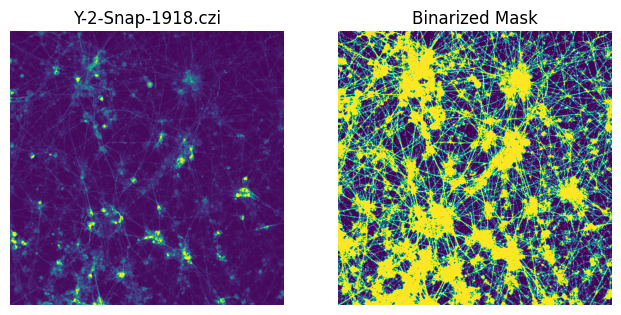

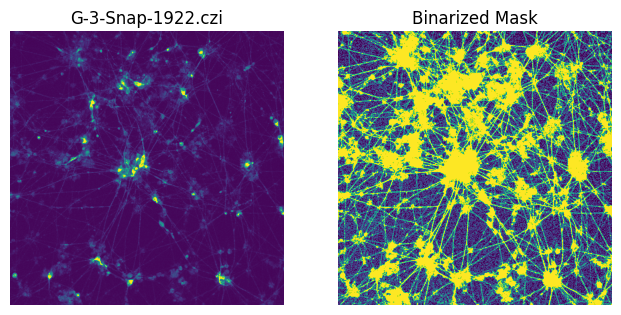

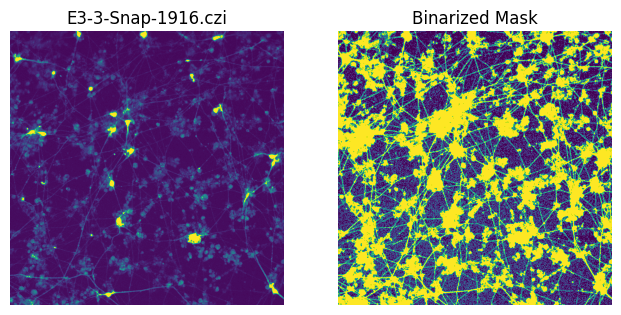

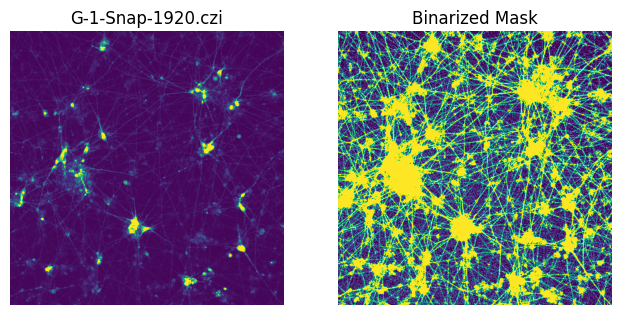

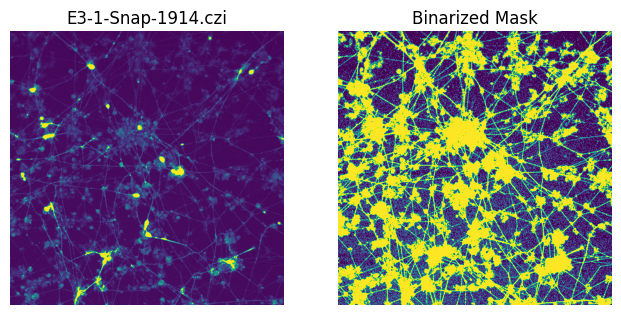

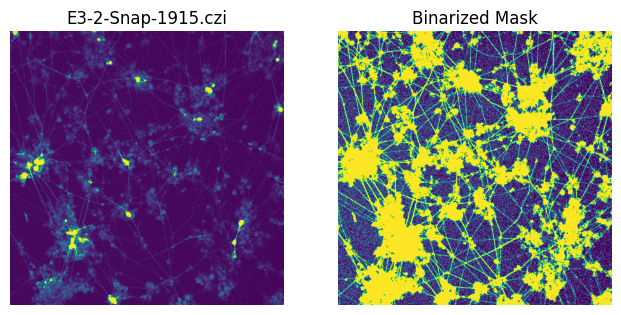

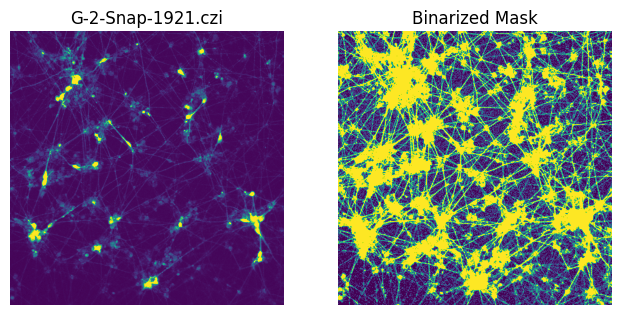

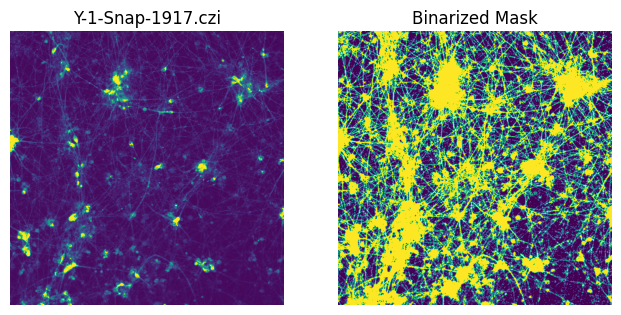

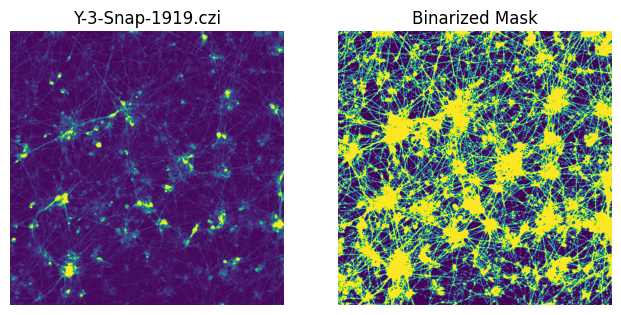

In [29]:
files = list_files_in_folder('../../imaging_data/022125-TMRM/')
values = []
conditions = []
wells = []
for i in files:
    x = load_image(f'../../imaging_data/022125-TMRM/{i}')
    binarized_mask = x.copy()
    binarized_mask[binarized_mask>np.percentile(binarized_mask, 50)] = 1
    binarized_mask[binarized_mask!=1] = 0
    values.append(np.mean(x[binarized_mask==1]))
    conditions.append(i.split('-')[0].upper())
    wells.append(i.split('-')[1])

    plt.figure(figsize=(12, 4))
    # Show combined image after alignment
    plt.subplot(1, 3, 2)
    plt.imshow(x, vmin=0, vmax=1)
    plt.title(i)
    plt.axis('off')  # Remove axes labels, ticks, and numbers

    # Show binarized mask
    plt.subplot(1, 3, 3)
    plt.imshow(binarized_mask)
    plt.title('Binarized Mask')
    plt.axis('off')  # Remove axes labels, ticks, and numbers


In [30]:
# get per-image metadata
dictionaries = [get_metadata(f'../../imaging_data/022125-TMRM/{x}') for x in files]
df2 = pd.DataFrame(dictionaries)
temp = return_non_unique_indices(df2)


AcquisitionDateAndTime
LaserEnableTime


In [31]:
conditions

['Y', 'G', 'E3', 'G', 'E3', 'E3', 'G', 'Y', 'Y']

In [32]:
L = df2['AcquisitionDateAndTime'].to_list()
all_times = [[parse_iso_timestamp(l[0])] for l in L]
time = [x[0].minute + x[0].second / 60 for x in all_times]


In [33]:
df = pd.DataFrame({'condition': conditions, 'well': wells, 'value': values})

y = df[df['condition']=='Y']['value'].values
e3 = df[df['condition']=='E3']['value'].values
yc = df[df['condition']=='G']['value'].values

df['condition'] = pd.Categorical(df['condition'], categories=['E3', 'Y', 'G'], ordered=True)
df['time'] = time

In [34]:
df

,condition,well,value,time
0,Y,2,0.147660,4.516667
1,G,3,0.101109,8.416667
2,E3,3,0.149070,2.133333
3,G,1,0.107172,6.350000
4,E3,1,0.144806,58.200000
5,E3,2,0.128057,59.183333
6,G,2,0.128609,7.650000
7,Y,1,0.164346,3.816667
8,Y,3,0.165367,5.483333


In [27]:
from scipy import stats

g_values = df[df['condition']=='G']['value']
e3_values = df[df['condition']=='E3']['value']

t_stat, p_value = stats.ttest_ind(g_values, e3_values)
t_stat, p_value

(-1.433775524938092, 0.22493654275488034)

In [28]:
from scipy import stats

g_values = df[df['condition']=='Y']['value']
e3_values = df[df['condition']=='E3']['value']

t_stat, p_value = stats.ttest_ind(g_values, e3_values)
t_stat, p_value

(1.6132013670663297, 0.18199761977976034)

In [26]:
df[df['condition']=='E3']['value']

2    0.377354
4    0.382236
5    0.340943
Name: value, dtype: float64

/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


<Axes: xlabel='condition', ylabel='value'>

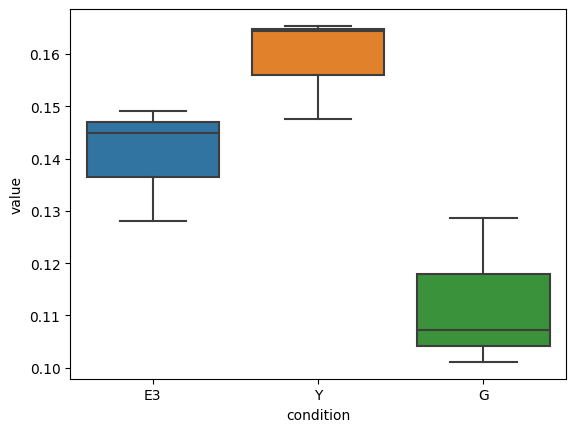

In [35]:
sns.boxplot(x='condition', y='value', data=df)

<Axes: xlabel='time', ylabel='value'>

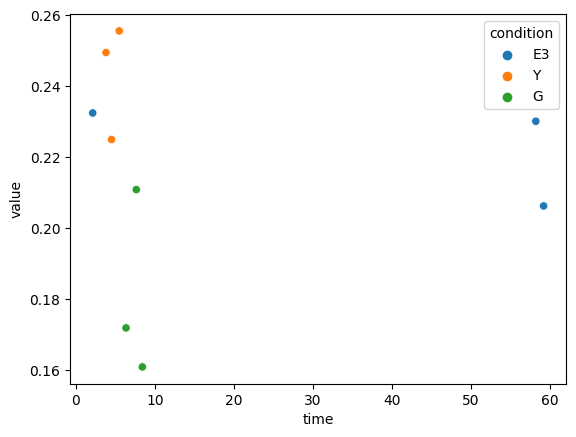

In [16]:
sns.scatterplot(x='time', y='value', data=df, hue='condition')

In [60]:
from statannotations.Annotator import Annotator
def detect_outliers_iqr(data):
    # Compute the first and third quartiles
    Q1, Q3 = np.percentile(data, [25, 75])
    IQR = Q3 - Q1
    
    # Define lower and upper bounds
    lower_bound = Q1 - 2 * IQR
    upper_bound = Q3 + 2 * IQR
    
    # Identify outliers
    outliers = (data < lower_bound) | (data > upper_bound)
    return outliers, lower_bound, upper_bound


def plot_boxplot_by_treatment(d, x_val, y_val, order, pairs, palette):
    # Draw the boxplot with a semi-transparent fill (alpha=0.5) applied via boxprops.
    ax = sns.barplot(
        data=d, 
        x=x_val, 
        y=y_val, 
        palette=palette, 
        order=order, 
        width=0.6, 
        capsize=0.1, 
        linewidth=1,
        #showfliers=False
    )
    # Overlay the stripplot
    sp = sns.stripplot(
        data=d, 
        x=x_val, 
        y=y_val, 
        dodge=True, 
        jitter=0.5, 
        alpha=1,  
        order=order, 
        palette=palette,
        size=4
    )

    #plt.ylim(0, plt.ylim()[1])
    # Shift the stripplot points slightly to the left.
    shift = 0.1  # Adjust this value as needed
    for i, coll in enumerate(sp.collections):
        if i == 0:
            shift = 0.7
        elif i == 1:
            shift = 0.05
        elif i == 2:
            shift = 0.4
            
        offsets = coll.get_offsets()
        # Subtract from the x-coordinate to move left
        offsets[:, 0] = offsets[:, 0] + shift
        coll.set_offsets(offsets)
    # Add statistical annotations
    annotator = Annotator(ax, pairs, data=d, x=x_val, y=y_val, order=order)
    annotator.configure(test='t-test_ind', text_format='full', loc='outside',
                        verbose=2, show_test_name=False)
    annotator.apply_and_annotate()

    plt.xticks(rotation=0)
    plt.xlabel('')

    # Adjust the boxes so that the face remains semi-transparent while the edge is opaque.
    # Try iterating over both ax.artists and ax.patches.
    for patch in ax.patches:
        # Get the current facecolor (an RGBA tuple)
        fc = patch.get_facecolor()
        # Set the facecolor to have your desired alpha (e.g., 0.5)
        patch.set_facecolor((fc[0], fc[1], fc[2], 0.5))
        # Set the edgecolor to the same RGB but fully opaque (alpha=1)
        patch.set_edgecolor((fc[0], fc[1], fc[2], 1.0))
        patch.set_linewidth(1.5)

    return ax

In [ ]:
# it's significant without outlier detection
outlier, _, _ = detect_outliers_iqr(df['value'].values)

E3 vs. Y: t-test independent samples, P_val:9.613e-05 t=-5.260e+00
Y vs. YC: t-test independent samples, P_val:1.593e-03 t=3.844e+00


/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/var/folders/y7/zpj5hbtd2bl78b1t9h2723hw0000gn/T/ipykernel_88255/3850389363.py:15: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sp = sns.stripplot(
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert i

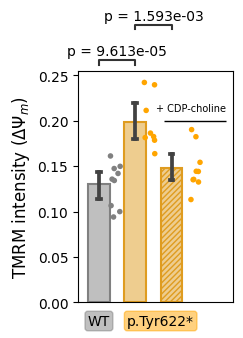

In [76]:
plt.figure(figsize=(2, 3))

ax1 = plot_boxplot_by_treatment(df[np.invert(outlier)], 'condition', 'value', order = ['E3', 'Y', 'YC'], pairs = [('E3', 'Y'), ('Y', 'YC')],palette={'E3': 'grey', 'Y': 'orange', 'YC': 'orange'} )
if ax1.patches:
    last_patch = ax1.patches[-1]
    last_patch.set_hatch('//////')

ax1.set_ylabel(r'TMRM intensity ($\Delta \Psi_m$)', fontsize=12)

# Add horizontal line and CDP-choline text for the second plot
ax1.hlines(y=0.20, xmin=1.8, xmax=3.5, linestyles='solid', color='black', linewidth=1)
ax1.text(3.5, 0.21, '+ CDP-choline', ha='right', fontsize=7)

ax1.set_xticks([])

# Add custom x-axis labels for the second plot:
ax1.text(0, -0.05, "WT", ha='center', va='top', transform=ax1.get_xaxis_transform(),
         bbox=dict(boxstyle="round,pad=0.2", fc="grey", ec="grey", alpha=0.5))
ax1.text(1.7, -0.05, "p.Tyr622*", ha='center', va='top', transform=ax1.get_xaxis_transform(),
         bbox=dict(boxstyle="round,pad=0.2", fc="orange", ec="orange", alpha=0.5))

plt.savefig('../../paper/main_plots/tmrm_choline.png', dpi=300, bbox_inches='tight')

In [112]:
print(df[df['condition']=='E3']['well'].values[np.argmin(np.abs(e3-np.median(e3)))])
print(df[df['condition']=='Y']['well'].values[np.argmin(np.abs(y-np.median(y)))])
print(df[df['condition']=='YC']['well'].values[np.argmin(np.abs(yc-np.median(yc)))])


9
9
4


In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable


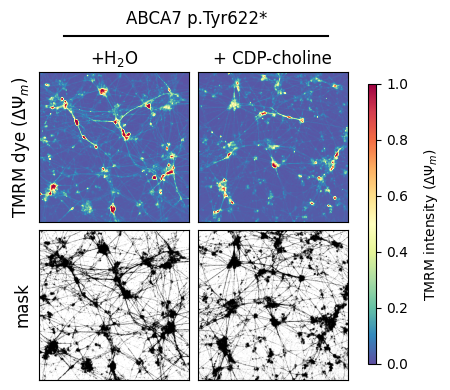

In [153]:
fig, axes = plt.subplots(2, 2, figsize=(4, 4))

# # First row
# img = load_image(f'../../imaging_data/012625-TMRM/E3-9-Snap-1525.czi')
# # Draw small white rectangle 16 pixels wide in lower right corner
# binarized_mask_e3_3 = img.copy()
# binarized_mask_e3_3[binarized_mask_e3_3>np.percentile(binarized_mask_e3_3, 75)] = 1
# binarized_mask_e3_3[binarized_mask_e3_3!=1] = 0

# axes[0, 0].imshow(img, vmax=1, cmap='Spectral_r')
# axes[0, 0].set_title('WT')
# axes[0, 0].set_xticks([])
# axes[0, 0].set_yticks([])

img = load_image(f'../../imaging_data/012625-TMRM/Y-9-Snap-1507.czi')
binarized_mask_y5 = img.copy()
binarized_mask_y5[binarized_mask_y5>np.percentile(binarized_mask_y5, 75)] = 1
binarized_mask_y5[binarized_mask_y5!=1] = 0

axes[0, 0].imshow(img, vmin=0, vmax=1, cmap='Spectral_r')
axes[0, 0].set_title('+H$_2$O')
axes[0, 0].set_xticks([])
axes[0, 0].set_yticks([])

img = load_image(f'../../imaging_data/012625-TMRM/YC-4-Snap-1511.czi')
binarized_mask_yc3 = img.copy()
binarized_mask_yc3[binarized_mask_yc3>np.percentile(binarized_mask_yc3, 75)] = 1
binarized_mask_yc3[binarized_mask_yc3!=1] = 0

axes[0, 1].imshow(img, vmin=0, vmax=1, cmap='Spectral_r')
axes[0, 1].set_title('+ CDP-choline')
axes[0, 1].set_xticks([])
axes[0, 1].set_yticks([])

# # Second row
# axes[1, 0].imshow(binarized_mask_e3_3, cmap='gray_r')
# axes[1, 0].set_xticks([])
# axes[1, 0].set_yticks([])

axes[1, 0].imshow(binarized_mask_y5, cmap='gray_r')
axes[1, 0].set_xticks([])
axes[1, 0].set_yticks([])

axes[1, 1].imshow(binarized_mask_yc3, cmap='gray_r')
axes[1, 1].set_xticks([])
axes[1, 1].set_yticks([])
# Add row labels
row_labels = [r'TMRM dye ($\Delta \Psi_m$)', 'mask']
for ax, label in zip(axes[:, 0], row_labels):
    ax.set_ylabel(label, rotation=90, size='large', labelpad=5)
# Add a color bar to the right of the plots

# Add colorbar
norm = plt.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap='Spectral_r', norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(r'TMRM intensity ($\Delta \Psi_m$)', labelpad=10, rotation=90, y=0.5)

plt.subplots_adjust(wspace=.05, hspace=.05)

# Add single bar and title spanning both columns
fig.text(0.52, 1, 'ABCA7 p.Tyr622*', horizontalalignment='center', fontsize=12)

# Add vertical bar above spanning both columns
bar_width = 5
bar_y = 0.97
fig.add_artist(plt.Line2D([0.19, 0.85], [bar_y, bar_y], color='black', transform=fig.transFigure))


#plt.tight_layout()
plt.savefig('../../paper/main_plots/tmrm_choline_images.png', dpi=300, bbox_inches='tight')
plt.show()

## Below is scrap

In [56]:
y[1:]

array([0.3380156 , 0.18131743, 0.21122796, 0.1636398 , 0.2419718 ,
       0.1862684 , 0.23939103, 0.18243172, 0.17845203])

/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<Axes: xlabel='condition', ylabel='value'>

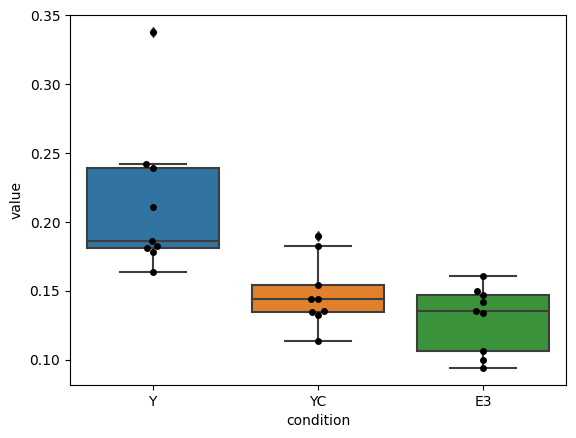

In [2]:
# process batch 1 images
e3_1 = get_time_series(['E3-1-baseline-Experiment-2675.czi',
                 'E3-1-oligo-Experiment-2675.czi',
                 'E3-1-FPPC-Experiment-2677.czi'], 'E3', '1', './011825_TMRM')

e3_2 = get_time_series(['E3-2-baeline-Experiment-2678.czi',
                 'E3-2-oligo-Experiment-2679.czi',
                 'E3-2-FPPC-Experiment-2680.czi'], 'E3', '2', './011825_TMRM')

y_1 = get_time_series(['Y-1-baseline-Experiment-2681.czi',
                'Y-1-oligo-Experiment-2682.czi', 
                'Y-1-FPPC-Experiment-2683.czi'],'Y622', '1', './011825_TMRM')

y_2 = get_time_series(['Y2-baseline-Experiment-2684.czi',
                'Y2-oligo-Experiment-2685.czi',
                'Y-2-FPPC-Experiment-2686.czi'], 'Y622', '2', './011825_TMRM')

yc_1 = get_time_series(['YC-1-baseline-Experiment-2687.czi',
                    'YC-1-oligo-Experiment-2688.czi',
                    'YC-1-FPPC-Experiment-2689.czi'], 'Y622+C', '1', './011825_TMRM')

yc_2 = get_time_series(['YC-2-baseline-Experiment-2690.czi',
                'YC-2-oligo-Experiment-2691.czi',
                'YC-2-FPPC-Experiment-2692.czi'], 'Y622+C', '2', './011825_TMRM')

NameError: name 'get_time_series' is not defined

/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='minutes', ylabel='intensity_norm'>

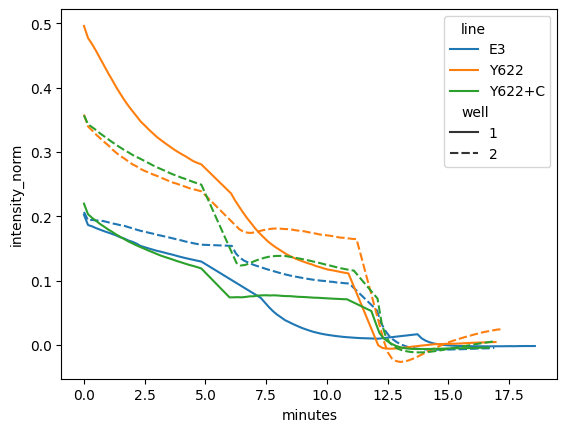

In [510]:
# look at batch 1
df_batch1 = pd.concat([e3_1, e3_2, y_1, y_2, yc_1, yc_2])

sns.lineplot(x='minutes', y='intensity_norm', data=df_batch1, hue='line', style='well')


The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
LaserEnableTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
LaserEnableTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
LaserEnableTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
The following metadata variables are NOT consistent 

/var/folders/y7/zpj5hbtd2bl78b1t9h2723hw0000gn/T/ipykernel_69624/618874645.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 5))


The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime
The following metadata variables are NOT consistent across images:
AcquisitionDateAndTime


<Figure size 800x500 with 0 Axes>

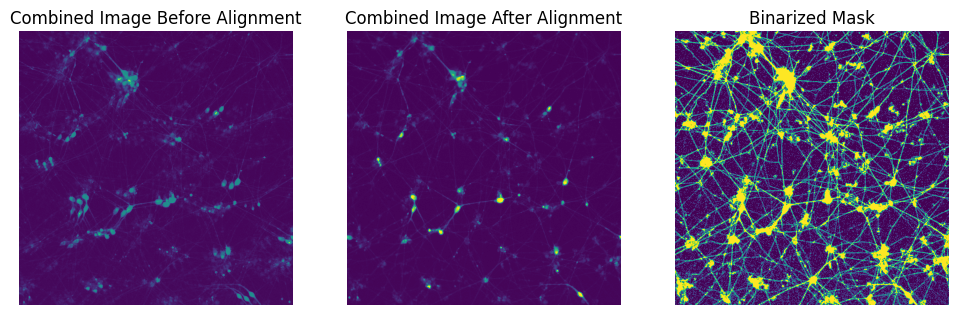

<Figure size 800x500 with 0 Axes>

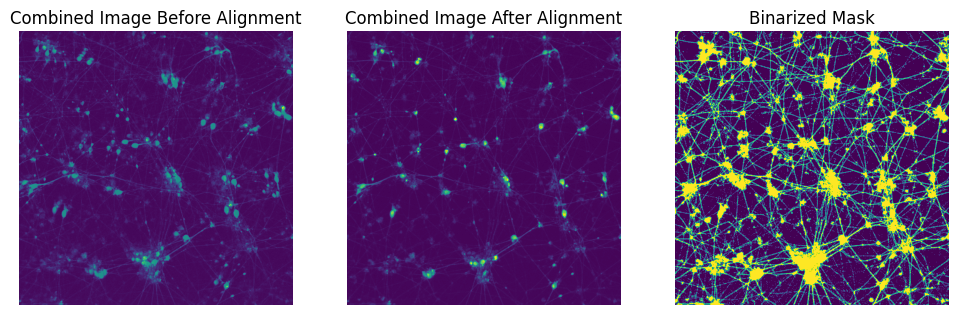

<Figure size 800x500 with 0 Axes>

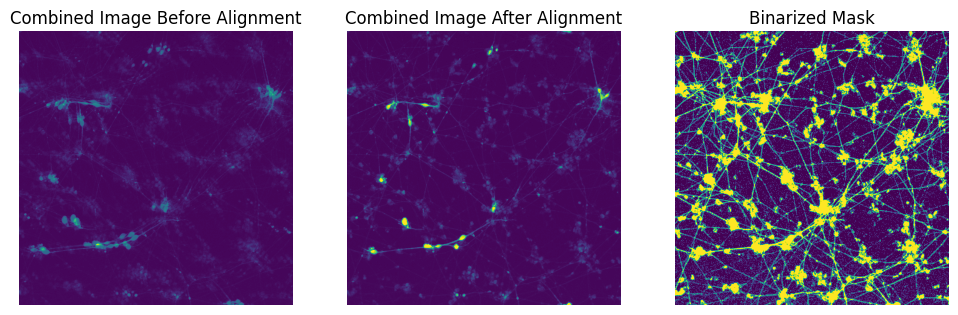

<Figure size 800x500 with 0 Axes>

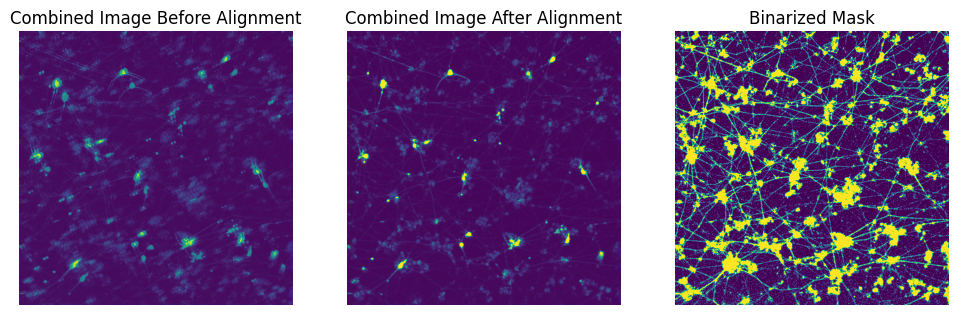

<Figure size 800x500 with 0 Axes>

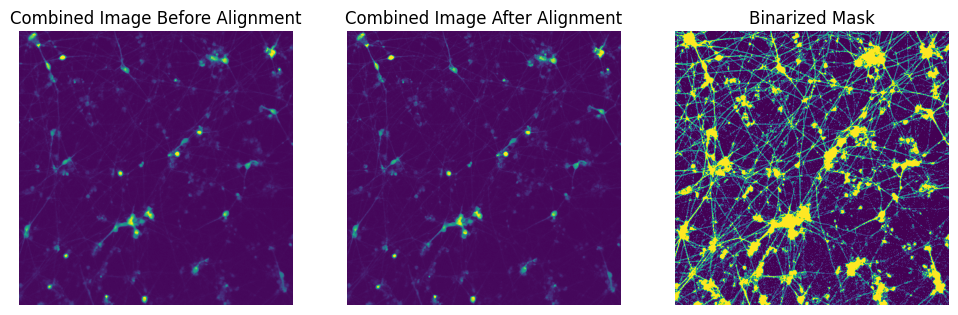

<Figure size 800x500 with 0 Axes>

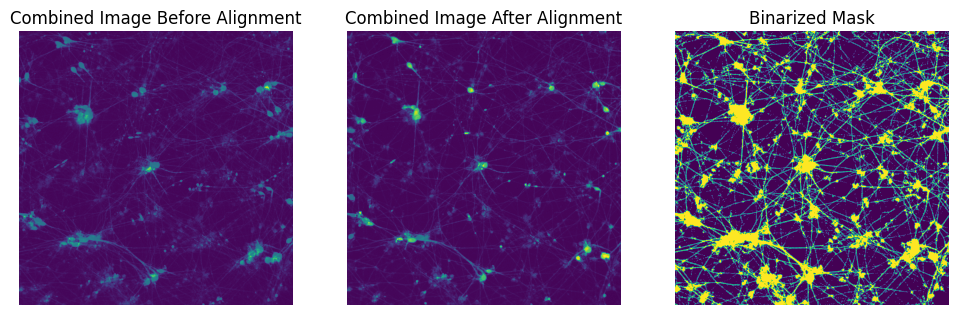

<Figure size 800x500 with 0 Axes>

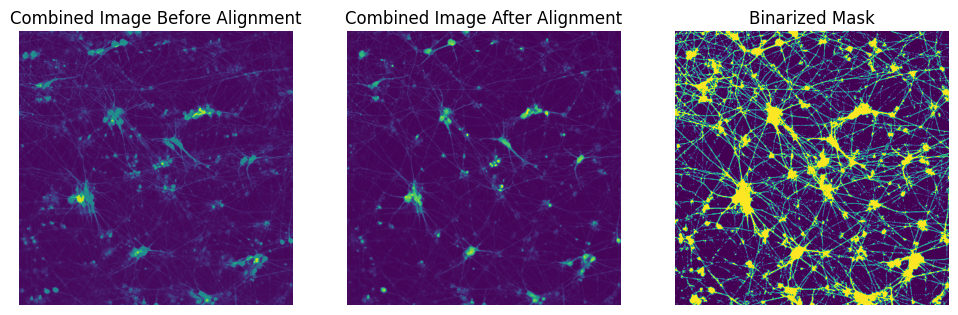

<Figure size 800x500 with 0 Axes>

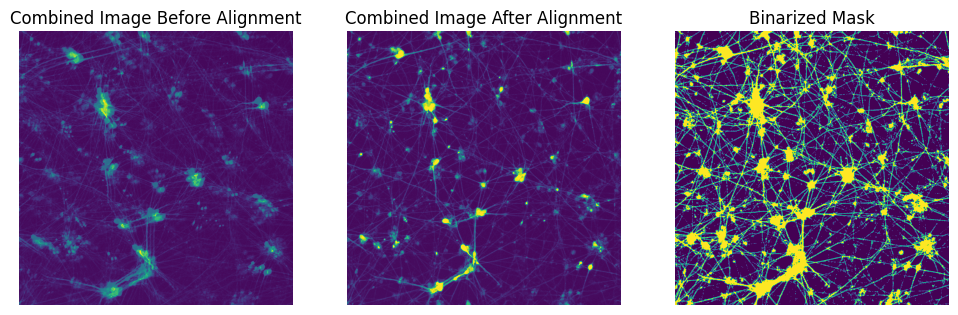

<Figure size 800x500 with 0 Axes>

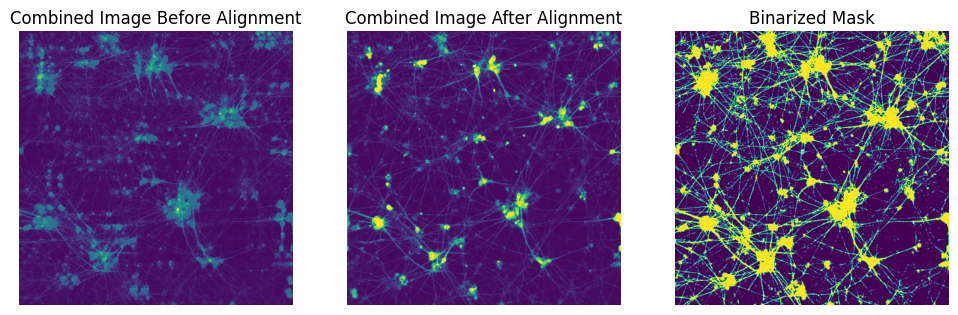

<Figure size 800x500 with 0 Axes>

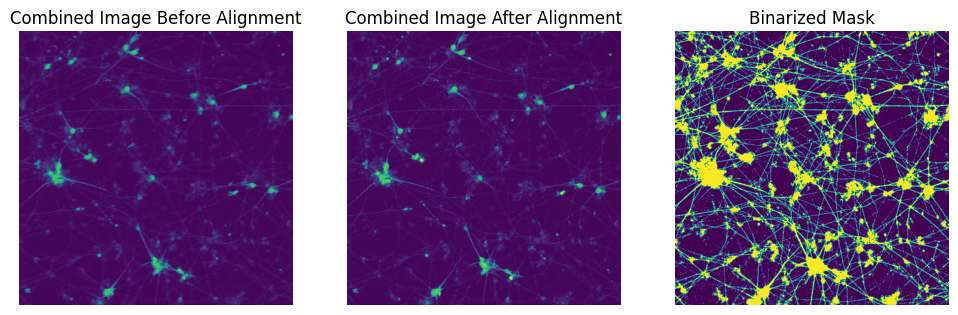

<Figure size 800x500 with 0 Axes>

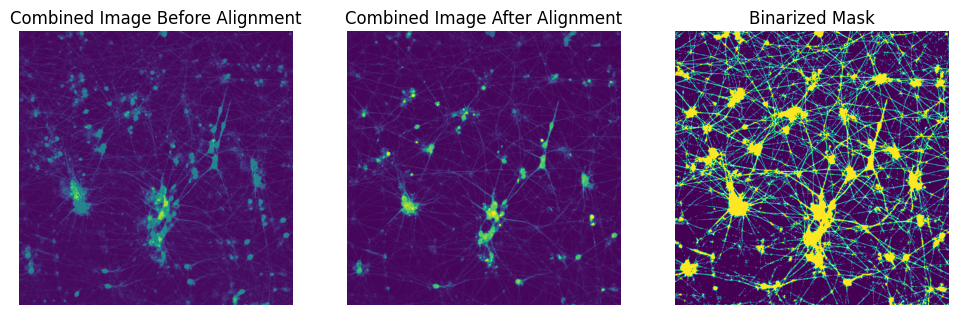

<Figure size 800x500 with 0 Axes>

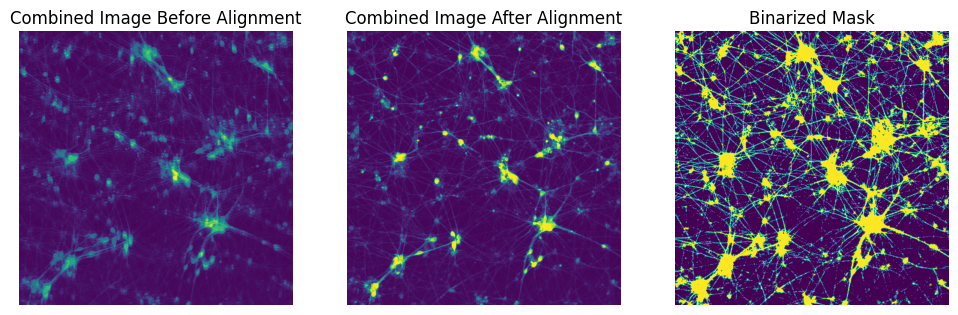

<Figure size 800x500 with 0 Axes>

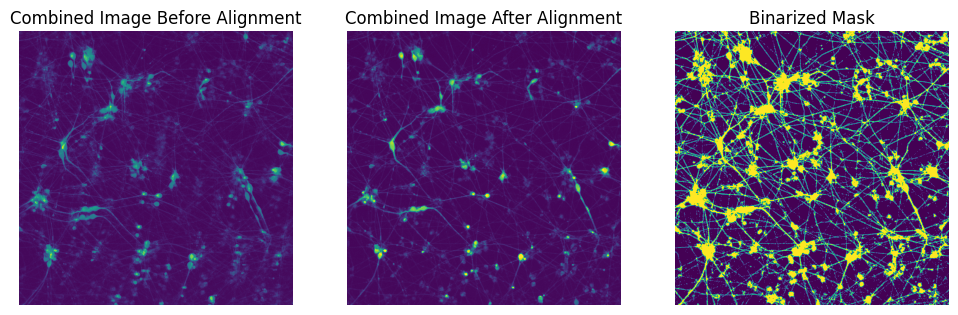

In [511]:
# get batch 2 data
e3_3 = get_time_series(['E3-3-baseline-Experiment-2747.czi',
'E3-3-oligo-Experiment-2748.czi',
'E3-3-FPPC-Experiment-2749.czi'], 'E3', '3', './011925-TMRM')
 
e3_4 = get_time_series(['E3-4-baseline-Experiment-2750.czi',
'E3-4-oligo-Experiment-2751.czi',
'E3-4-FPPC-Experiment-2752.czi'], 'E3', '4', './011925-TMRM')

e3_5 = get_time_series(['E3-5-baseline-Experiment-2765.czi',
'E3-5-oligo-Experiment-2766.czi',
'E3-5-FPPC-Experiment-2767.czi'], 'E3', '5', './011925-TMRM')

e3_6 = get_time_series(['E3-6-baseline-Experiment-2768.czi',
'E3-6-oligo-Experiment-2769.czi',
'E3-6-FPPC-Experiment-2770.czi'], 'E3', '6', './011925-TMRM')

y4 = get_time_series(['Y-4-baseline-Experiment-2738.czi',
'Y4-oligo-Experiment-2739.czi',
'Y4-FPPC-Experiment-2740.czi'], 'Y622', '4', './011925-TMRM')

y5 = get_time_series(['Y-5-baseline-Experiment-2753.czi',
'Y-5-oligo-Experiment-2754.czi',
'Y-5-FPPC-Experiment-2755.czi'], 'Y622', '5', './011925-TMRM')

y6 = get_time_series(['Y-6-baseline-Experiment-2756.czi',
 'Y-6-oligo-Experiment-2757.czi',
'Y-6-fppc-Experiment-2758.czi'], 'Y622', '6', './011925-TMRM')

y7 = get_time_series(['Y-7-baseline-Experiment-2771.czi',
'Y-7-oligo-Experiment-2772.czi',
'Y-7-FPPC-Experiment-2773.czi'], 'Y622', '7', './011925-TMRM')

y8 = get_time_series(['Y-8-baseline-Experiment-2774.czi',
'Y-8-oligo-Experiment-2775.czi',
'Y-8-FPPC-Experiment-2776.czi'], 'Y622', '8', './011925-TMRM')

yc3 = get_time_series(['YC-3-baseline-Experiment-2741.czi',
 'YC-3-oligo-Experiment-2742.czi',
 'YC-3-FPPC-Experiment-2743.czi'], 'Y622+C', '3', './011925-TMRM')

yc4 = get_time_series(['YC-4-baseline-Experiment-2744.czi',
 'YC-4-oligo-Experiment-2745.czi',
 'YC-4-FPPC-Experiment-2746.czi'], 'Y622+C', '4', './011925-TMRM')

yc5 = get_time_series(['YC-5-baseline-Experiment-2759.czi',
 'YC-5-oligo-Experiment-2760.czi',
 'YC-5-FPPC-Experiment-2761.czi'], 'Y622+C', '5', './011925-TMRM')

 
yc6 = get_time_series(['YC-6-baseline-Experiment-2762.czi',
 'YC-6-oligo-Experiment-2763.czi',
 'YC-6-FPPC-Experiment-2764.czi'], 'Y622+C', '6', './011925-TMRM')

In [512]:
df_batch2 = pd.concat([ e3_3, e3_4, e3_5, e3_6, y4, y5, y6, y7, y8, yc3, yc4, yc5, yc6])

/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='line', ylabel='intensity_norm'>

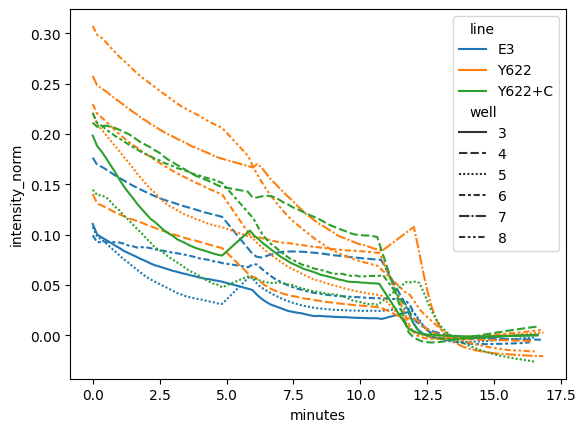

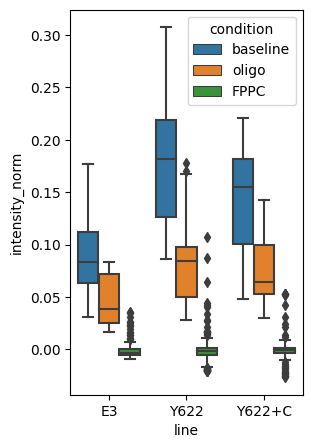

In [527]:
# look at batch 2
sns.lineplot(x='minutes', y='intensity_norm', data=df_batch2, hue='line', style='well')
plt.figure(figsize=(3,5))
sns.boxplot(x='line', y='intensity_norm', data=df_batch2, hue='condition')


In [570]:
from scipy.stats import ttest_ind

# normalize data to control
df_grouped_b1 = df_batch1.groupby(['condition', 'line', 'well'])['intensity_norm'].mean().reset_index()
mean_intensity_baseline_e3_b1 = df_grouped_b1[(df_grouped_b1['condition'] == 'baseline') & (df_grouped_b1['line'] == 'E3')]['intensity_norm'].mean()
df_grouped_b1['intensity_norm_E3'] = df_grouped_b1['intensity_norm']/mean_intensity_baseline_e3_b1

df_grouped_b2 = df_batch2.groupby(['condition', 'line', 'well'])['intensity_norm'].mean().reset_index()
mean_intensity_baseline_e3_b2 = df_grouped_b2[(df_grouped_b2['condition'] == 'baseline') & (df_grouped_b2['line'] == 'E3')]['intensity_norm'].mean()
df_grouped_b2['intensity_norm_E3'] = df_grouped_b2['intensity_norm']/mean_intensity_baseline_e3_b2

df = pd.concat([df_grouped_b1, df_grouped_b2])

# Batch 1
baseline_e3_b1 = df_grouped_b1[(df_grouped_b1['condition'] == 'baseline') & (df_grouped_b1['line'] == 'E3')]['intensity_norm_E3']
baseline_y622_b1 = df_grouped_b1[(df_grouped_b1['condition'] == 'baseline') & (df_grouped_b1['line'] == 'Y622')]['intensity_norm_E3']
baseline_yc_b1 = df_grouped_b1[(df_grouped_b1['condition'] == 'baseline') & (df_grouped_b1['line'] == 'Y622+C')]['intensity_norm_E3']

t_stat, p_value = ttest_ind(baseline_e3_b1, baseline_y622_b1)
print(f"Batch 1 T-test between E3 and Y622 baselines: t-statistic = {t_stat}, p-value = {p_value}")

t_stat, p_value = ttest_ind(baseline_y622_b1, baseline_yc_b1)
print(f"Batch 1 T-test between Y622 and YC baselines: t-statistic = {t_stat}, p-value = {p_value}")

# Batch 2
baseline_e3_b2 = df_grouped_b2[(df_grouped_b2['condition'] == 'baseline') & (df_grouped_b2['line'] == 'E3')]['intensity_norm_E3']
baseline_y622_b2 = df_grouped_b2[(df_grouped_b2['condition'] == 'baseline') & (df_grouped_b2['line'] == 'Y622')]['intensity_norm_E3']
baseline_yc_b2 = df_grouped_b2[(df_grouped_b2['condition'] == 'baseline') & (df_grouped_b2['line'] == 'Y622+C')]['intensity_norm_E3']

t_stat, p_value = ttest_ind(baseline_e3_b2, baseline_y622_b2)
print(f"Batch 2 T-test between E3 and Y622 baselines: t-statistic = {t_stat}, p-value = {p_value}")

t_stat, p_value = ttest_ind(baseline_y622_b2, baseline_yc_b2)
print(f"Batch 2 T-test between Y622 and YC baselines: t-statistic = {t_stat}, p-value = {p_value}")

# Combined Batches
baseline_e3_combined = pd.concat([baseline_e3_b1, baseline_e3_b2])
baseline_y622_combined = pd.concat([baseline_y622_b1, baseline_y622_b2])
baseline_yc_combined = pd.concat([baseline_yc_b1, baseline_yc_b2])

t_stat, p_value = ttest_ind(baseline_e3_combined, baseline_y622_combined)
print(f"Combined Batches T-test between E3 and Y622 baselines: t-statistic = {t_stat}, p-value = {p_value}")

t_stat, p_value = ttest_ind(baseline_y622_combined, baseline_yc_combined)
print(f"Combined Batches T-test between Y622 and YC baselines: t-statistic = {t_stat}, p-value = {p_value}")

Batch 1 T-test between E3 and Y622 baselines: t-statistic = -3.696349279047848, p-value = 0.06602434485641381
Batch 1 T-test between Y622 and YC baselines: t-statistic = 1.2268429731550228, p-value = 0.3447061873992775
Batch 2 T-test between E3 and Y622 baselines: t-statistic = -2.80212030214351, p-value = 0.026443557096961282
Batch 2 T-test between Y622 and YC baselines: t-statistic = 1.0459221196843833, p-value = 0.33036365915596455
Combined Batches T-test between E3 and Y622 baselines: t-statistic = -4.005709324576035, p-value = 0.002065933564744792
Combined Batches T-test between Y622 and YC baselines: t-statistic = 1.649732568858231, p-value = 0.1272321128353742


/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignore

(0.0, 3.5)

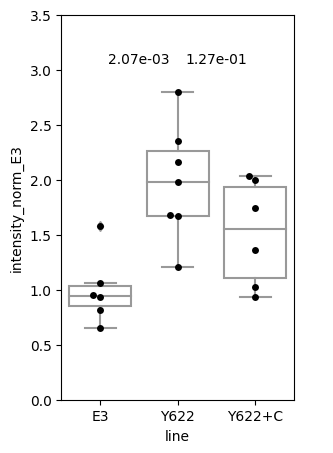

In [571]:
plt.figure(figsize=(3,5))
df = pd.concat([df_grouped_b1, df_grouped_b2])
sns.boxplot(x='line', y='intensity_norm_E3', data=df[df['condition']=='baseline'], color='white')
sns.swarmplot(x='line', y='intensity_norm_E3', data=df[df['condition']=='baseline'], color='black')

# Calculate p-values
t_stat_e3_y622, p_value_e3_y622 = ttest_ind(baseline_e3_combined, baseline_y622_combined)
t_stat_y622_yc, p_value_y622_yc = ttest_ind(baseline_y622_combined, baseline_yc_combined)

# Add p-values above the plot
plt.text(0.5, 3.1, f'{p_value_e3_y622:.2e}', ha='center', va='center', fontsize=10, color='black')
plt.text(1.5, 3.1, f'{p_value_e3_yc:.2e}', ha='center', va='center', fontsize=10, color='black')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
plt.ylim(0, 3.5)

/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/djuna/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignore

Text(0.5, -1.777777777777784, '')

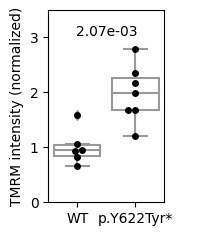

In [572]:
plt.figure(figsize=(1.5,2.5))
df = pd.concat([df_grouped_b1, df_grouped_b2])
sns.boxplot(x='line', y='intensity_norm_E3', data=df[(df['condition']=='baseline') & (df['line']!='Y622+C')], color='white')
sns.swarmplot(x='line', y='intensity_norm_E3', data=df[(df['condition']=='baseline') & (df['line']!='Y622+C')], color='black')

# Calculate p-values
t_stat_e3_y622, p_value_e3_y622 = ttest_ind(baseline_e3_combined, baseline_y622_combined)

# Add p-values above the plot
plt.text(0.5, 3.1, f'{p_value_e3_y622:.2e}', ha='center', va='center', fontsize=10, color='black')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
plt.ylim(0, 3.5)
plt.ylabel('TMRM intensity (normalized)')
plt.xticks(ticks=[0, 1], labels=['WT', 'p.Y622Tyr*'])
plt.xlabel('')


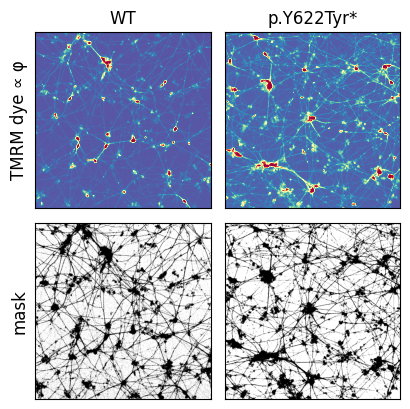

In [541]:
fig, axes = plt.subplots(2, 2, figsize=(4.2, 4.2))

# First row
img = AICSImage(f'./011925-TMRM/E3-3-baseline-Experiment-2747.czi')
reshaped_img = img.data.reshape(30, 1024, 1024)
out = int_to_float(reshaped_img)
# Draw small white rectangle 16 pixels wide in lower right corner
binarized_mask_e3_3 = out[0].copy()
binarized_mask_e3_3[binarized_mask_e3_3>np.percentile(binarized_mask_e3_3, 75)] = 1
binarized_mask_e3_3[binarized_mask_e3_3!=1] = 0

axes[0, 0].imshow(out[0], vmax=1, cmap='Spectral_r')
axes[0, 0].set_title('WT')
axes[0, 0].set_xticks([])
axes[0, 0].set_yticks([])

img = AICSImage(f'./011925-TMRM/Y-5-baseline-Experiment-2753.czi')
reshaped_img = img.data.reshape(30, 1024, 1024)
out = int_to_float(reshaped_img)
binarized_mask_y5 = out[0].copy()
binarized_mask_y5[binarized_mask_y5>np.percentile(binarized_mask_y5, 75)] = 1
binarized_mask_y5[binarized_mask_y5!=1] = 0

axes[0, 1].imshow(out[0], vmax=1, cmap='Spectral_r')
axes[0, 1].set_title('p.Y622Tyr*')
axes[0, 1].set_xticks([])
axes[0, 1].set_yticks([])

# Second row
axes[1, 0].imshow(binarized_mask_e3_3, cmap='gray_r')
axes[1, 0].set_xticks([])
axes[1, 0].set_yticks([])

axes[1, 1].imshow(binarized_mask_y5, cmap='gray_r')
axes[1, 1].set_xticks([])
axes[1, 1].set_yticks([])

# Add row labels
row_labels = ['TMRM dye \u221D \u03C6', 'mask']
for ax, label in zip(axes[:, 0], row_labels):
    ax.set_ylabel(label, rotation=90, size='large', labelpad=5)
# Add a color bar to the right of the plots
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.tight_layout()
plt.show()

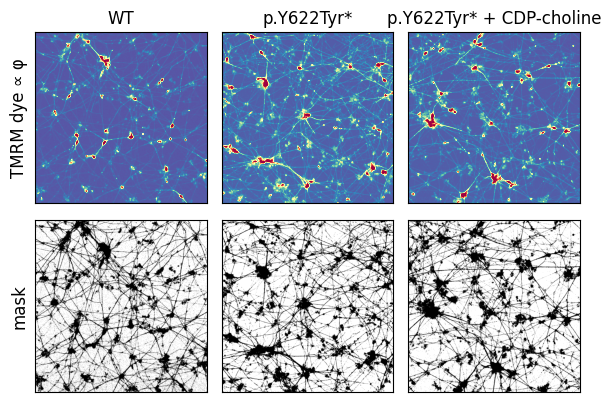

In [484]:
fig, axes = plt.subplots(2, 3, figsize=(6, 4.2))

# First row
img = AICSImage(f'./011925-TMRM/E3-3-baseline-Experiment-2747.czi')
reshaped_img = img.data.reshape(30, 1024, 1024)
out = int_to_float(reshaped_img)
# Draw small white rectangle 16 pixels wide in lower right corner
binarized_mask_e3_3 = out[0].copy()
binarized_mask_e3_3[binarized_mask_e3_3>np.percentile(binarized_mask_e3_3, 75)] = 1
binarized_mask_e3_3[binarized_mask_e3_3!=1] = 0

axes[0, 0].imshow(out[0], vmax=1, cmap='Spectral_r')
axes[0, 0].set_title('WT')
axes[0, 0].set_xticks([])
axes[0, 0].set_yticks([])

img = AICSImage(f'./011925-TMRM/Y-5-baseline-Experiment-2753.czi')
reshaped_img = img.data.reshape(30, 1024, 1024)
out = int_to_float(reshaped_img)
binarized_mask_y5 = out[0].copy()
binarized_mask_y5[binarized_mask_y5>np.percentile(binarized_mask_y5, 75)] = 1
binarized_mask_y5[binarized_mask_y5!=1] = 0

axes[0, 1].imshow(out[0], vmax=1, cmap='Spectral_r')
axes[0, 1].set_title('p.Y622Tyr*')
axes[0, 1].set_xticks([])
axes[0, 1].set_yticks([])

img = AICSImage(f'./011925-TMRM/YC-3-baseline-Experiment-2741.czi')
reshaped_img = img.data.reshape(30, 1024, 1024)
out = int_to_float(reshaped_img)
binarized_mask_yc3 = out[0].copy()
binarized_mask_yc3[binarized_mask_yc3>np.percentile(binarized_mask_yc3, 75)] = 1
binarized_mask_yc3[binarized_mask_yc3!=1] = 0

axes[0, 2].imshow(out[0], vmax=1, cmap='Spectral_r')
axes[0, 2].set_title('p.Y622Tyr* + CDP-choline')
axes[0, 2].set_xticks([])
axes[0, 2].set_yticks([])

# Second row
axes[1, 0].imshow(binarized_mask_e3_3, cmap='gray_r')
axes[1, 0].set_xticks([])
axes[1, 0].set_yticks([])

axes[1, 1].imshow(binarized_mask_y5, cmap='gray_r')
axes[1, 1].set_xticks([])
axes[1, 1].set_yticks([])

axes[1, 2].imshow(binarized_mask_yc3, cmap='gray_r')
axes[1, 2].set_xticks([])
axes[1, 2].set_yticks([])
# Add row labels
row_labels = ['TMRM dye \u221D \u03C6', 'mask']
for ax, label in zip(axes[:, 0], row_labels):
    ax.set_ylabel(label, rotation=90, size='large', labelpad=5)
# Add a color bar to the right of the plots
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.tight_layout()
plt.show()